In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
# Load dataset
df = pd.read_csv('american_bankruptcy.csv')

In [3]:
# Rename columns X1 to X18 to actual financial terms
df.rename(columns={
    'X1': 'Current assets',
    'X2': 'Cost of goods sold',
    'X3': 'Depreciation and amortization',
    'X4': 'EBITDA',
    'X5': 'Inventory',
    'X6': 'Net Income',
    'X7': 'Total Receivables',
    'X8': 'Market Value',
    'X9': 'Net Sales',
    'X10': 'Total Assets',
    'X11': 'Total Long-term Debt',
    'X12': 'EBIT',
    'X13': 'Gross Profit',
    'X14': 'Total Current Liabilities',
    'X15': 'Retained Earnings',
    'X16': 'Total Revenue',
    'X17': 'Total Liabilities',
    'X18': 'Total Operating Expenses'
}, inplace=True)

In [5]:
df.head()

,company_name,status_label,year,Current assets,Cost of goods sold,Depreciation and amortization,EBITDA,Inventory,Net Income,Total Receivables,...,Net Sales,Total Assets,Total Long-term Debt,EBIT,Gross Profit,Total Current Liabilities,Retained Earnings,Total Revenue,Total Liabilities,Total Operating Expenses
0,C_1,alive,1999,511.267,833.107,18.373,89.031,336.018,35.163,128.348,...,1024.333,740.998,180.447,70.658,191.226,163.816,201.026,1024.333,401.483,935.302
1,C_1,alive,2000,485.856,713.811,18.577,64.367,320.590,18.531,115.187,...,874.255,701.854,179.987,45.790,160.444,125.392,204.065,874.255,361.642,809.888
2,C_1,alive,2001,436.656,526.477,22.496,27.207,286.588,-58.939,77.528,...,638.721,710.199,217.699,4.711,112.244,150.464,139.603,638.721,399.964,611.514
3,C_1,alive,2002,396.412,496.747,27.172,30.745,259.954,-12.410,66.322,...,606.337,686.621,164.658,3.573,109.590,203.575,124.106,606.337,391.633,575.592
4,C_1,alive,2003,432.204,523.302,26.680,47.491,247.245,3.504,104.661,...,651.958,709.292,248.666,20.811,128.656,131.261,131.884,651.958,407.608,604.467


In [9]:
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78682 entries, 0 to 78681
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   company_name                   78682 non-null  object 
 1   status_label                   78682 non-null  object 
 2   year                           78682 non-null  int64  
 3   Current assets                 78682 non-null  float64
 4   Cost of goods sold             78682 non-null  float64
 5   Depreciation and amortization  78682 non-null  float64
 6   EBITDA                         78682 non-null  float64
 7   Inventory                      78682 non-null  float64
 8   Net Income                     78682 non-null  float64
 9   Total Receivables              78682 non-null  float64
 10  Market Value                   78682 non-null  float64
 11  Net Sales                      78682 non-null  float64
 12  Total Assets                   78682 non-null 

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
year,78682.0,2007.506317,5.742768,1999.0000,2002.00000,2007.00000,2012.00000,2018.00
Current assets,78682.0,880.362485,3928.564794,-7.7600,18.92400,100.44950,431.52675,169662.00
Cost of goods sold,78682.0,1594.529029,8930.484664,-366.6450,17.03825,103.66100,634.54800,374623.00
Depreciation and amortization,78682.0,121.234256,652.376804,0.0000,1.19200,7.92950,47.97175,28430.00
EBITDA,78682.0,376.759424,2012.023142,-21913.0000,-0.81100,15.03450,139.65525,81730.00
Inventory,78682.0,201.605717,1060.766096,0.0000,0.00000,7.02300,74.74725,62567.00
Net Income,78682.0,129.382453,1265.532022,-98696.0000,-7.41575,1.61600,40.14425,104821.00
Total Receivables,78682.0,286.832743,1335.978571,-0.0060,3.28125,22.82000,131.58050,65812.00
Market Value,78682.0,3414.354610,18414.103647,0.0001,34.98000,227.51185,1244.88995,1073390.54
Net Sales,78682.0,2364.019706,11950.068842,-1964.9990,27.54850,186.59850,1046.40250,511729.00


In [13]:
df.describe(include='object')

,company_name,status_label
count,78682,78682
unique,8971,2
top,C_4081,alive
freq,20,73462


In [15]:
df.isnull().sum()

company_name                     0
status_label                     0
year                             0
Current assets                   0
Cost of goods sold               0
Depreciation and amortization    0
EBITDA                           0
Inventory                        0
Net Income                       0
Total Receivables                0
Market Value                     0
Net Sales                        0
Total Assets                     0
Total Long-term Debt             0
EBIT                             0
Gross Profit                     0
Total Current Liabilities        0
Retained Earnings                0
Total Revenue                    0
Total Liabilities                0
Total Operating Expenses         0
dtype: int64

In [21]:
# Convert 'status_label' to numerical values
# 'alive' -> 0 (Not Bankrupt), 'failed' -> 1 (Bankrupt)
df['status_label'] = df['status_label'].apply(lambda x: 1 if x == 'failed' else 0)

# Check the conversion
print(df['status_label'].value_counts())


status_label
0    73462
1     5220
Name: count, dtype: int64


Data Visualization

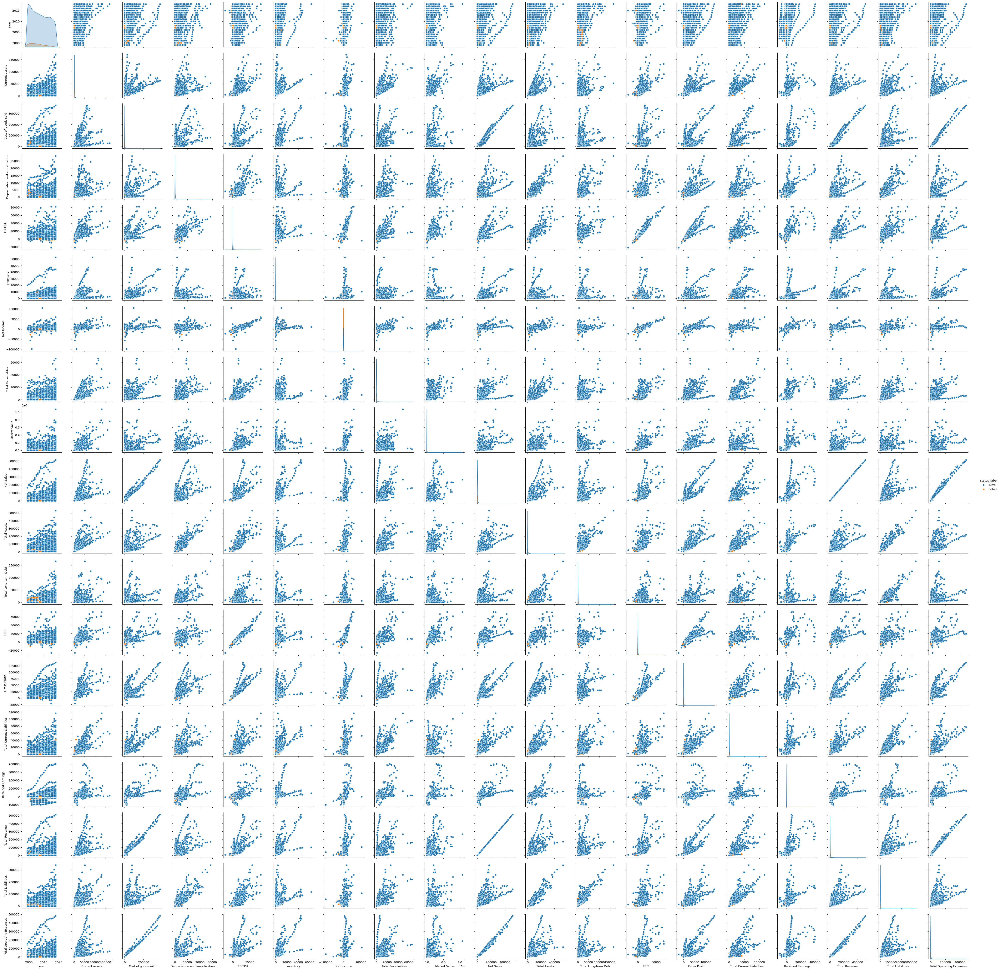

In [19]:
import matplotlib.pyplot as plt 
import seaborn as sns
sns.pairplot(data=df,hue='status_label',kind='scatter')

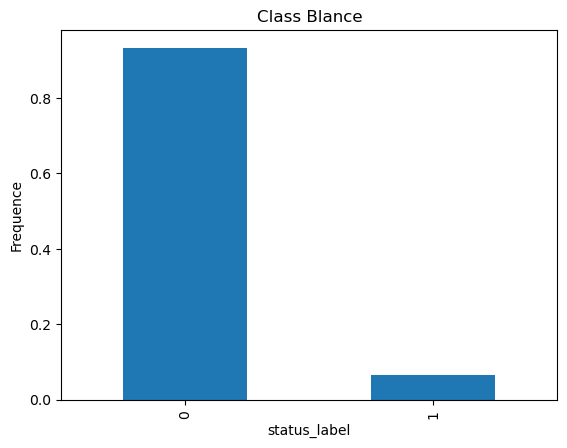

In [25]:
df["status_label"].value_counts(normalize = True).plot(
    kind = "bar",
    ylabel = "Frequence",
    xlabel = "status_label",
    title = "Class Blance"
);

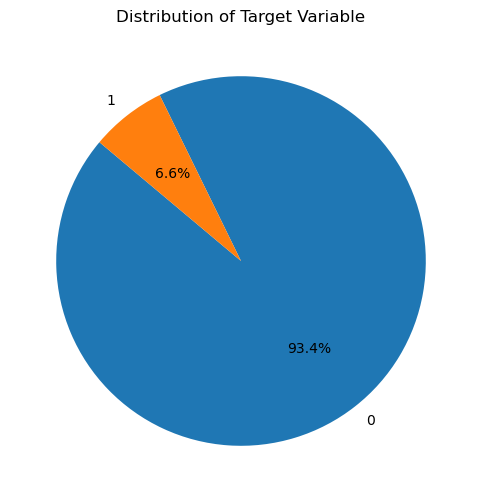

In [33]:
# Calculate the distribution of target variable
status_counts = df['status_label'].value_counts()

# Plot pie chart for target variable
plt.figure(figsize=(6, 6))
plt.pie(status_counts, labels=status_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Target Variable')
plt.show()


In [35]:
# Calculate Debt-to-Equity Ratio (Total Liabilities / Total Assets)
df['Debt_Equity_Ratio'] = df['Total Liabilities'] / (df['Total Assets'] - df['Total Liabilities'])
# Calculate the Altman Z-Score
df['Altman_Z_Score'] = (1.2 * (df['Current assets'] - df['Total Current Liabilities']) / df['Total Assets'] +
                        1.4 * (df['Retained Earnings'] / df['Total Assets']) +
                        3.3 * (df['EBIT'] / df['Total Assets']) +
                        0.6 * (df['Market Value'] / df['Total Liabilities']) +
                        1.0 * (df['Net Sales'] / df['Total Assets']))

# Check the new columns to confirm
print(df[['Debt_Equity_Ratio', 'Altman_Z_Score']].head())

   Debt_Equity_Ratio  Altman_Z_Score
0           1.182519        3.196587
1           1.062990        3.109968
2           1.289229        2.226949
3           1.327623        1.709901
4           1.351109        2.240159


In [37]:
df

,company_name,status_label,year,Current assets,Cost of goods sold,Depreciation and amortization,EBITDA,Inventory,Net Income,Total Receivables,...,Total Long-term Debt,EBIT,Gross Profit,Total Current Liabilities,Retained Earnings,Total Revenue,Total Liabilities,Total Operating Expenses,Debt_Equity_Ratio,Altman_Z_Score
0,C_1,0,1999,511.267,833.107,18.373,89.031,336.018,35.163,128.348,...,180.447,70.658,191.226,163.816,201.026,1024.333,401.483,935.302,1.182519,3.196587
1,C_1,0,2000,485.856,713.811,18.577,64.367,320.590,18.531,115.187,...,179.987,45.790,160.444,125.392,204.065,874.255,361.642,809.888,1.062990,3.109968
2,C_1,0,2001,436.656,526.477,22.496,27.207,286.588,-58.939,77.528,...,217.699,4.711,112.244,150.464,139.603,638.721,399.964,611.514,1.289229,2.226949
3,C_1,0,2002,396.412,496.747,27.172,30.745,259.954,-12.410,66.322,...,164.658,3.573,109.590,203.575,124.106,606.337,391.633,575.592,1.327623,1.709901
4,C_1,0,2003,432.204,523.302,26.680,47.491,247.245,3.504,104.661,...,248.666,20.811,128.656,131.261,131.884,651.958,407.608,604.467,1.351109,2.240159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78677,C_8971,0,2014,233.211,43.338,14.094,45.615,3.376,25.261,22.846,...,184.666,31.521,60.885,28.197,28.095,104.223,225.887,58.608,0.258685,2.458453
78678,C_8971,0,2015,105.559,59.184,42.592,202.133,2.288,129.688,54.611,...,770.103,159.541,231.969,88.128,157.783,291.153,880.327,89.020,0.893190,0.927365
78679,C_8971,0,2016,63.971,69.074,65.057,79.051,2.581,-1.442,42.467,...,683.985,13.994,100.784,85.765,156.341,169.858,770.233,90.807,0.789172,0.685027
78680,C_8971,0,2017,135.207,66.527,65.330,69.171,2.013,-20.401,27.217,...,694.035,3.841,95.357,82.010,135.941,161.884,776.697,92.713,0.809554,0.565692


In [39]:
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78682 entries, 0 to 78681
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   company_name                   78682 non-null  object 
 1   status_label                   78682 non-null  int64  
 2   year                           78682 non-null  int64  
 3   Current assets                 78682 non-null  float64
 4   Cost of goods sold             78682 non-null  float64
 5   Depreciation and amortization  78682 non-null  float64
 6   EBITDA                         78682 non-null  float64
 7   Inventory                      78682 non-null  float64
 8   Net Income                     78682 non-null  float64
 9   Total Receivables              78682 non-null  float64
 10  Market Value                   78682 non-null  float64
 11  Net Sales                      78682 non-null  float64
 12  Total Assets                   78682 non-null 

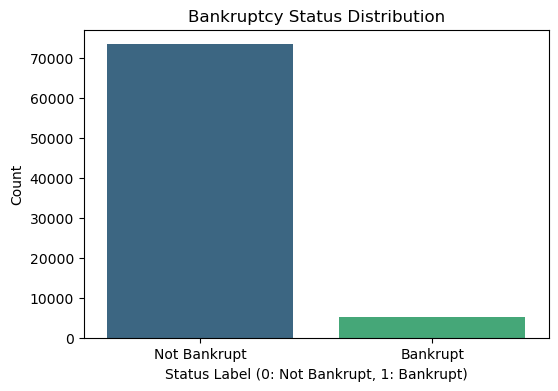

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='status_label', palette='viridis')
plt.title("Bankruptcy Status Distribution")
plt.xlabel("Status Label (0: Not Bankrupt, 1: Bankrupt)")
plt.ylabel("Count")
plt.xticks([0, 1], ["Not Bankrupt", "Bankrupt"])
plt.show()


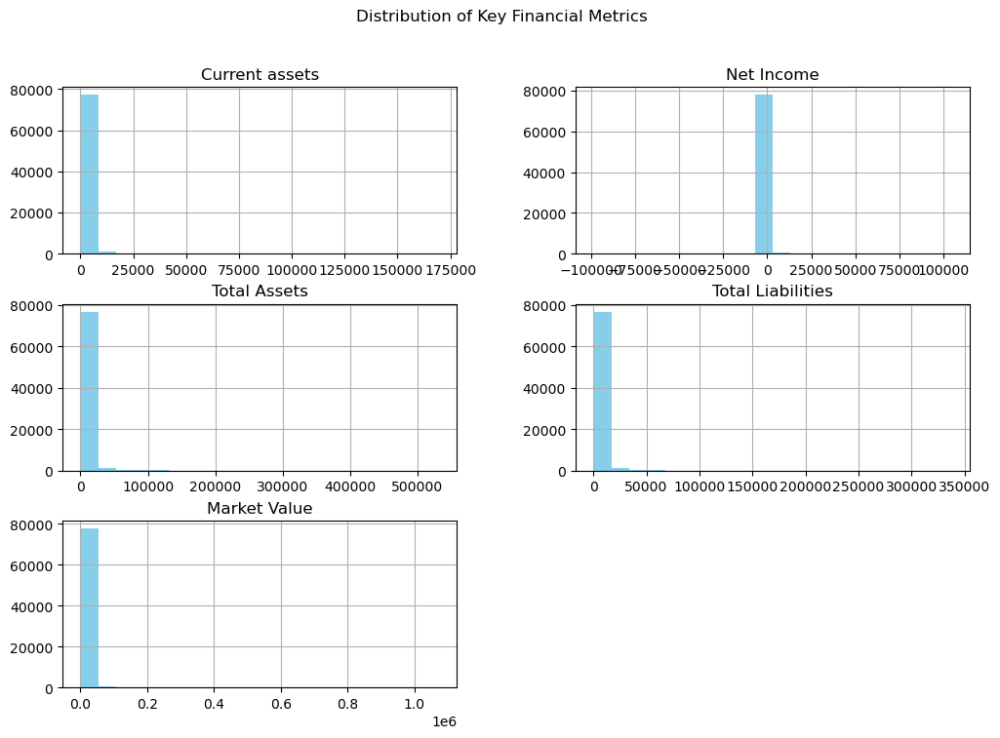

In [43]:
financial_columns = ['Current assets', 'Net Income', 'Total Assets', 'Total Liabilities', 'Market Value']
df[financial_columns].hist(bins=20, figsize=(12, 8), color='skyblue')
plt.suptitle("Distribution of Key Financial Metrics")
plt.show()


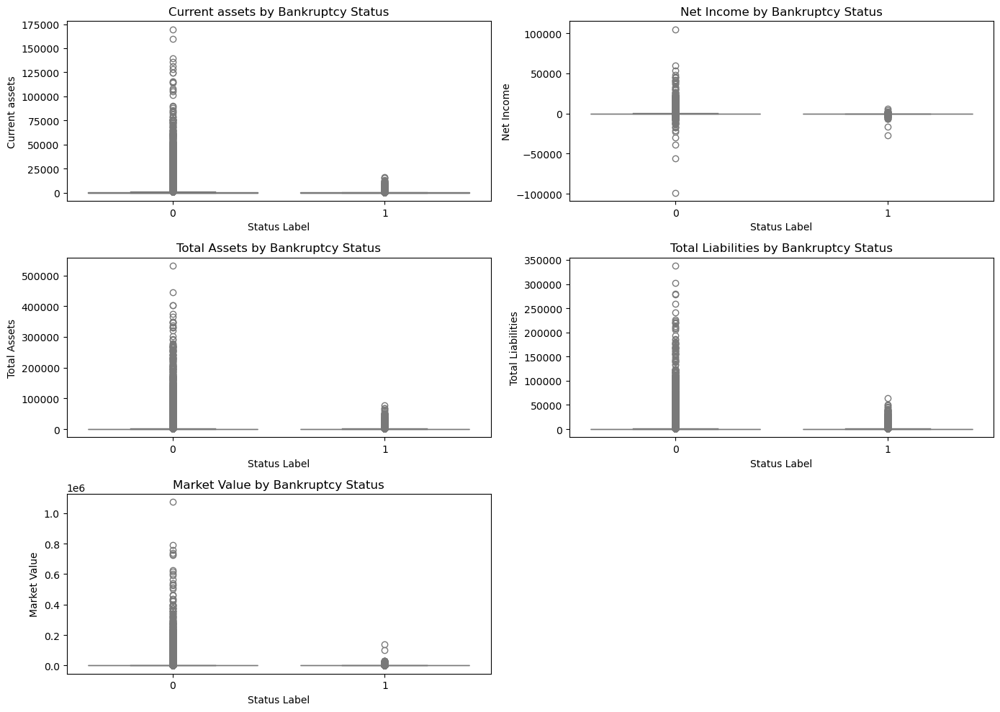

In [45]:
plt.figure(figsize=(14, 10))
for i, column in enumerate(financial_columns, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(data=df, x='status_label', y=column, palette='coolwarm')
    plt.title(f"{column} by Bankruptcy Status")
    plt.xlabel("Status Label")
    plt.ylabel(column)
plt.tight_layout()
plt.show()


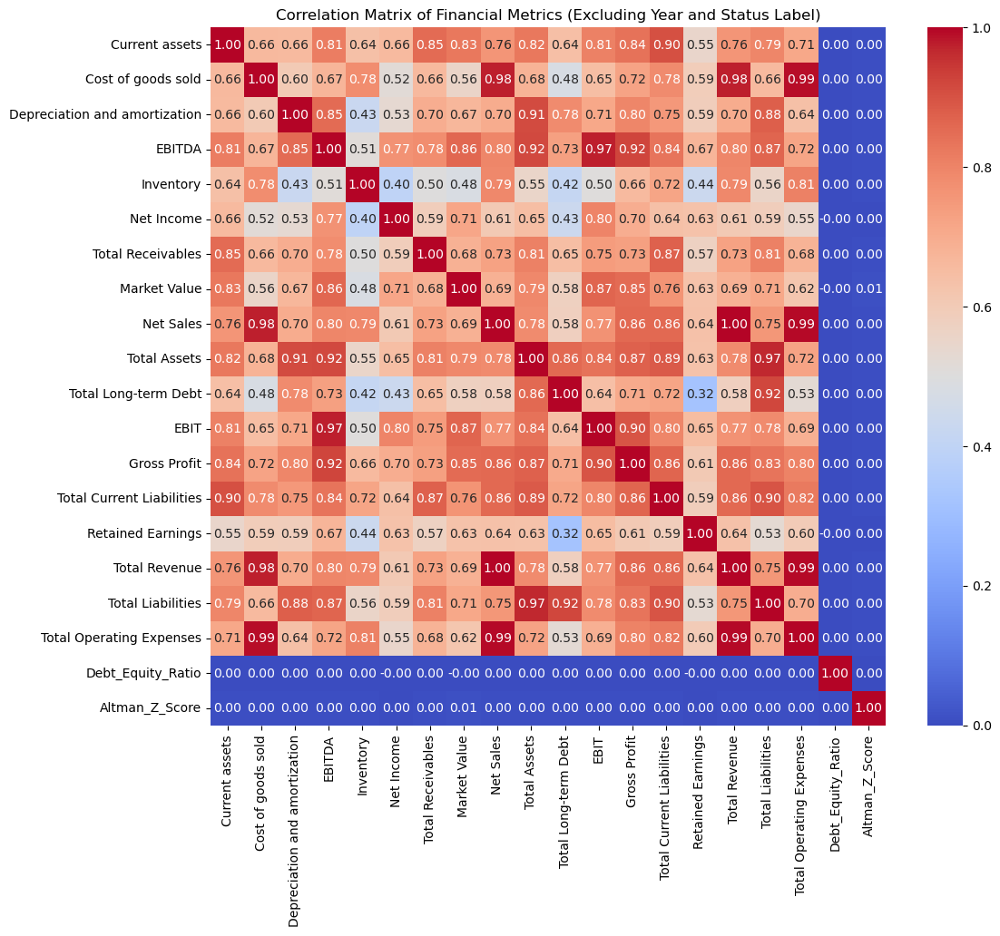

In [55]:
# Select numeric columns, excluding 'year' and 'status_label'
numeric_df = df.select_dtypes(include=['float64', 'int64']).drop(['year', 'status_label'], axis=1)

plt.figure(figsize=(12, 10))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title("Correlation Matrix of Financial Metrics (Excluding Year and Status Label)")
plt.show()


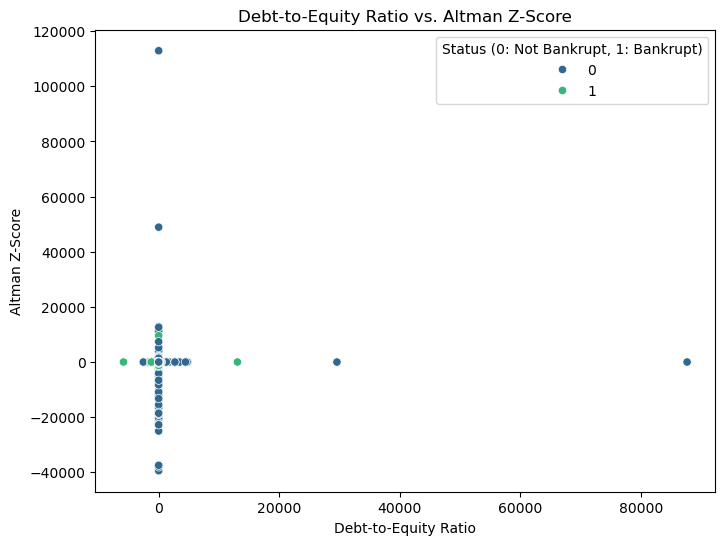

In [49]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='Debt_Equity_Ratio', y='Altman_Z_Score', hue='status_label', palette='viridis')
plt.title("Debt-to-Equity Ratio vs. Altman Z-Score")
plt.xlabel("Debt-to-Equity Ratio")
plt.ylabel("Altman Z-Score")
plt.legend(title="Status (0: Not Bankrupt, 1: Bankrupt)")
plt.show()


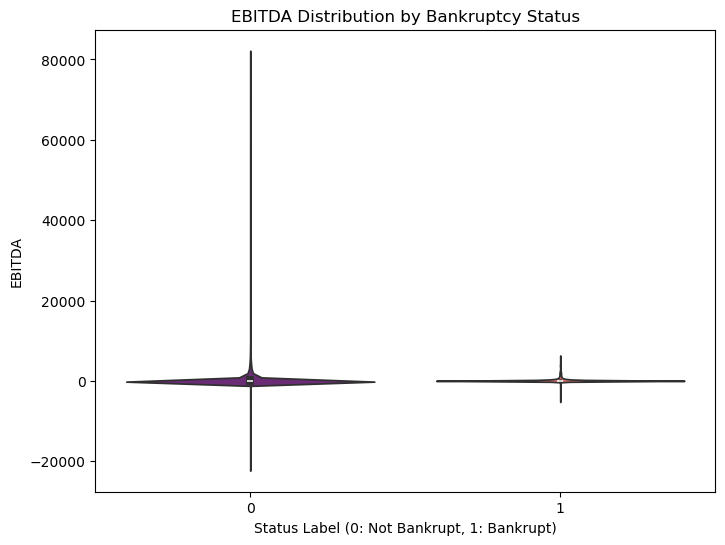

In [51]:
plt.figure(figsize=(8, 6))
sns.violinplot(data=df, x='status_label', y='EBITDA', palette='magma')
plt.title("EBITDA Distribution by Bankruptcy Status")
plt.xlabel("Status Label (0: Not Bankrupt, 1: Bankrupt)")
plt.ylabel("EBITDA")
plt.show()


In [57]:
# Check unique values and basic statistics for Altman_Z_Score and Debt_Equity_Ratio
print("Unique values in Altman_Z_Score:", df['Altman_Z_Score'].unique())
print("Unique values in Debt_Equity_Ratio:", df['Debt_Equity_Ratio'].unique())

# Check summary statistics
print(df[['Altman_Z_Score', 'Debt_Equity_Ratio']].describe())


Unique values in Altman_Z_Score: [3.19658653 3.10996754 2.2269491  ... 0.68502652 0.56569185 0.47670666]
Unique values in Debt_Equity_Ratio: [1.18251918 1.06299014 1.28922913 ... 0.78917154 0.80955438 0.78087025]
       Altman_Z_Score  Debt_Equity_Ratio
count    78682.000000       7.868200e+04
mean        -8.331615                inf
std        614.496106                NaN
min     -39433.690512      -5.847000e+03
25%          0.909922       2.708156e-01
50%          2.734518       7.522801e-01
75%          5.104427       1.662228e+00
max     112927.140549                inf


In [63]:
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, ADASYN
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
X = df.drop(columns=['status_label', 'company_name', 'year'])
y = df['status_label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

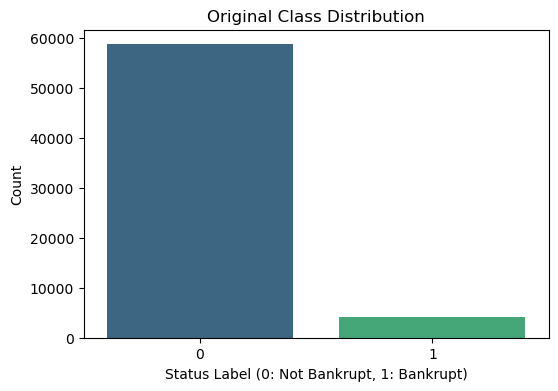

In [65]:
plt.figure(figsize=(6, 4))
sns.countplot(x=y_train, palette='viridis')
plt.title("Original Class Distribution")
plt.xlabel("Status Label (0: Not Bankrupt, 1: Bankrupt)")
plt.ylabel("Count")
plt.show()
